In [1]:
import os
import uuid
import pandas as pd
import numpy as np
from pykalman import KalmanFilter
from hurst import compute_Hc
from untrade.client import Client

import warnings 
warnings.filterwarnings("ignore")


def process_data(data):
    class Indicators:
        """
        Class to calculate technical indicators using class methods on OHLCV data.
        """
        data = None  

        @classmethod
        def initialize(cls, data: pd.DataFrame):
            """
            Initialize the class with a DataFrame.
            
            Parameters:
            - data (pd.DataFrame): DataFrame with 'open', 'high', 'low', 'close', 'volume' columns
            """
            if not all(col in data.columns for col in ['open', 'high', 'low', 'close', 'volume']):
                raise ValueError("DataFrame must contain 'open', 'high', 'low', 'close', and 'volume' columns")
            cls.data = data.copy()

        @classmethod
        def calculate_prev_ohlcv(cls):
            """Calculate previous OHLCV columns by shifting current values."""
            cls.data['prev_open'] = cls.data['open'].shift(1)
            cls.data['prev_high'] = cls.data['high'].shift(1)
            cls.data['prev_low'] = cls.data['low'].shift(1)
            cls.data['prev_close'] = cls.data['close'].shift(1)
            cls.data['prev_volume'] = cls.data['volume'].shift(1)
            cls.data.dropna(subset=['prev_open', 'prev_high', 'prev_low', 'prev_close', 'prev_volume'], inplace=True)

        @classmethod
        def apply_kalman_filter(cls, transition_covariance: float = 0.01):
            """Apply Kalman Filter to prev_close to calculate filtered_close."""
            prices = cls.data['prev_close'].dropna().values.reshape(-1, 1)
            kf = KalmanFilter(
                transition_matrices=[1],
                observation_matrices=[1],
                initial_state_mean=prices[0],
                initial_state_covariance=1,
                observation_covariance=0.1,
                transition_covariance=transition_covariance
            )
            state_means, _ = kf.filter(prices)
            cls.data['prev_filtered_close'] = pd.Series(state_means.flatten(), index=cls.data['prev_close'].dropna().index)

        @classmethod
        def calculate_rsi(cls, length=14):
            """
            Calculate RSI for the given asset and add it to the DataFrame.
            """
            delta = cls.data['prev_close'].diff()
            gain = np.where(delta > 0, delta, 0)
            loss = np.where(delta < 0, -delta, 0)
            # Corrected code with index preservation
            avg_gain = pd.Series(gain, index=cls.data.index).rolling(window=length, min_periods=1).mean()
            avg_loss = pd.Series(loss, index=cls.data.index).rolling(window=length, min_periods=1).mean()
            rs = avg_gain / avg_loss
            rsi = 100 - (100 / (1 + rs))
            cls.data['rsi'] = rsi
            



        @classmethod
        def calculate_supertrend(cls, atr_length=10, factor=3.0):
            """
            Calculate Supertrend indicator without using pandas_ta.
            
            Parameters:
            - atr_length (int): Length for ATR calculation.
            - factor (float): Multiplier for ATR to calculate Supertrend.
            """
            # Calculate True Range (TR)
            cls.data['tr'] = np.maximum(
                cls.data['prev_high'] - cls.data['prev_low'],
                np.maximum(
                    abs(cls.data['prev_high'] - cls.data['prev_close'].shift(1)),
                    abs(cls.data['prev_low'] - cls.data['prev_close'].shift(1))
                )
            )

            # Calculate ATR
            cls.data['atr'] = cls.data['tr'].rolling(window=atr_length).mean()

            # Calculate Supertrend
            hl2 = (cls.data['prev_high'] + cls.data['prev_low']) / 2
            upper_band = hl2 + (factor * cls.data['atr'])
            lower_band = hl2 - (factor * cls.data['atr'])

            supertrend = [0] * len(cls.data)
            direction = [1] * len(cls.data)  # 1 for uptrend, -1 for downtrend

            for i in range(1, len(cls.data)):
                if cls.data['prev_close'].iloc[i] > upper_band.iloc[i - 1]:
                    supertrend[i] = lower_band.iloc[i]
                    direction[i] = -1
                elif cls.data['prev_close'].iloc[i] < lower_band.iloc[i - 1]:
                    supertrend[i] = upper_band.iloc[i]
                    direction[i] = 1
                else:
                    supertrend[i] = supertrend[i - 1]
                    direction[i] = direction[i - 1]

            cls.data['supertrend'] = supertrend
            cls.data['supertrend_direction'] = direction

        @classmethod
        def calculate_macd(cls, fast_length=6, slow_length=12, signal_length=14):
            """
            Calculate MACD indicator.
            """
            fast_ema = cls.data['prev_close'].ewm(span=fast_length, adjust=False).mean()
            slow_ema = cls.data['prev_close'].ewm(span=slow_length, adjust=False).mean()
            cls.data['macd'] = fast_ema - slow_ema
            cls.data['macd_signal'] = cls.data['macd'].ewm(span=signal_length, adjust=False).mean()
            cls.data['macd_histogram'] = cls.data['macd'] - cls.data['macd_signal']


        @classmethod
        def calculate_bollinger_bands(cls, window: int = 14, num_std: float = 2.5):
            """
            Calculate Bollinger Bands for the given asset and add them to the DataFrame.
            
            Parameters:
            - window (int): Rolling window size for the moving average and standard deviation.
            - num_std (float): Number of standard deviations to use for the upper and lower bands.
            """
            cls.data['bb_middle'] = cls.data['prev_close'].rolling(window=window).mean()
            rolling_std = cls.data['prev_close'].rolling(window=window).std()
            cls.data['bb_upper'] = cls.data['bb_middle'] + (rolling_std * num_std)
            cls.data['bb_lower'] = cls.data['bb_middle'] - (rolling_std * num_std)

        @classmethod
        def calculate_adx(cls, period: int = 12):
            """Calculate Average Directional Index (ADX)."""
            # Calculate +DM and -DM (Directional Movement)
            cls.data['plus_dm'] = np.where(
                (cls.data['high'] - cls.data['prev_high']) > (cls.data['prev_low'] - cls.data['low']),
                np.maximum(cls.data['high'] - cls.data['prev_high'], 0),
                0
            )
            cls.data['minus_dm'] = np.where(
                (cls.data['prev_low'] - cls.data['low']) > (cls.data['high'] - cls.data['prev_high']),
                np.maximum(cls.data['prev_low'] - cls.data['low'], 0),
                0
            )

            # Smooth +DM and -DM with Wilder's smoothing (EMA-like)
            cls.data['plus_di'] = 100 * cls.data['plus_dm'].ewm(span=period, adjust=False).mean() / cls.data['atr']
            cls.data['minus_di'] = 100 * cls.data['minus_dm'].ewm(span=period, adjust=False).mean() / cls.data['atr']

            # Calculate DX (Directional Index)
            cls.data['dx'] = 100 * abs(cls.data['plus_di'] - cls.data['minus_di']) / (cls.data['plus_di'] + cls.data['minus_di']).replace(0, np.nan)

            # ADX is the smoothed DX
            cls.data['adx'] = cls.data['dx'].ewm(span=period, adjust=False).mean()




        @classmethod
        def calculate_heikin_ashi(cls):
            """Calculate Heikin-Ashi candles based on previous OHLC data after dropping NaN row."""
            if not all(col in cls.data.columns for col in ['prev_open', 'prev_high', 'prev_low', 'prev_close']):
                cls.calculate_prev_ohlcv() 
            ha_close = (cls.data['prev_open'] + cls.data['prev_high'] + cls.data['prev_low'] + cls.data['prev_close']) / 4            
            ha_open = pd.Series(index=cls.data.index, dtype=float)
            ha_open.iloc[0] = cls.data['prev_open'].iloc[0]            
            for i in range(1, len(cls.data)):
                ha_open.iloc[i] = (ha_open.iloc[i-1] + ha_close.iloc[i-1]) / 2
            ha_high = cls.data[['prev_high', 'prev_open', 'prev_close']].max(axis=1)
            ha_low = cls.data[['prev_low', 'prev_open', 'prev_close']].min(axis=1)

            # Assign to DataFrame
            cls.data['ha_open'] = ha_open
            cls.data['ha_high'] = ha_high
            cls.data['ha_low'] = ha_low
            cls.data['ha_close'] = ha_close

        @classmethod
        def hurst_exponent(cls, ts):
            """Calculate the Hurst exponent using rescaled range analysis."""
            if len(ts) < 20 or np.any(np.isnan(ts)) or np.std(ts) == 0:
                return np.nan
            try:
                H, _, _ = compute_Hc(ts)
                if not 0 <= H <= 1:
                    return np.nan
                return H
            except:
                return np.nan


        @classmethod
        def rolling_hurst_exponent(cls, window: int = 100):
            """Apply the Hurst exponent calculation in a rolling window on prev_close."""
            cls.data['hurst'] = cls.data['prev_close'].rolling(window=window, min_periods=window).apply(cls.hurst_exponent, raw=True)

        @classmethod
        def calculate_cusum(cls, window: int = 5, delta: float = 0.8):
            """Calculate CUSUM indicators (cusum_hi and cusum_lo) using prev_close and prev_filtered_close."""
            n = len(cls.data)
            S_hi = np.zeros(n)
            S_lo = np.zeros(n)
            price = cls.data['prev_close'].values
            mu = cls.data['prev_filtered_close'].values
            rolling_sigma = cls.data['prev_close'].rolling(window=window).std()
            k = delta * rolling_sigma.fillna(0).values
            
            for i in range(1, n):
                S_hi[i] = max(0, S_hi[i-1] + (price[i] - mu[i] - k[i]))
                S_lo[i] = max(0, S_lo[i-1] + (-price[i] + mu[i] - k[i]))
            
            cls.data['cusum_hi'] = S_hi
            cls.data['cusum_lo'] = S_lo

        @classmethod
        def calculate_fdi(cls, window: int = 30):
            """Calculate Fractal Dimension Index (FDI) using prev_filtered_close."""
            def fractal_dimension(series):
                n = len(series)
                if n <= 1 or np.all(np.isnan(series)):
                    return np.nan
                L = np.sum(np.abs(np.diff(series)))
                d = np.max(np.abs(series - series[0]))
                if L == 0 or d == 0:
                    return np.nan
                return np.log(n) / (np.log(n) + np.log(d / L))
            
            cls.data['fdi'] = cls.data['prev_filtered_close'].rolling(window=window, min_periods=window).apply(fractal_dimension, raw=True)


        @classmethod
        def identify_regimes(cls, window: int = 5, delta: float = 0.8, h_factor=1.5):

            rolling_sigma = cls.data['prev_close'].rolling(window=window).std()
            k = delta * rolling_sigma
            rolling_h = h_factor * rolling_sigma

            conditions = [
                # Bullish regime:
                ((cls.data['cusum_hi'] > rolling_h) & (cls.data['hurst'] > 0.5) & (cls.data['fdi'] <1.5)),

                # Bearish regime: 
                ((cls.data['cusum_lo'] > rolling_h) & (cls.data['hurst'] > 0.5) & (cls.data['fdi'] <1.5))
            ]
            choices = ['bullish', 'bearish']
            cls.data['regime'] = np.select(conditions, choices, default='No Trend')

    # Calculate Indicators
    Indicators.initialize(data)
    Indicators.calculate_prev_ohlcv()
    Indicators.apply_kalman_filter()
    Indicators.rolling_hurst_exponent()
    Indicators.calculate_cusum()
    Indicators.calculate_fdi()
    Indicators.calculate_supertrend()
    Indicators.calculate_rsi()
    Indicators.calculate_macd()
    Indicators.calculate_adx()
    # Indicators.calculate_vwap()
    Indicators.calculate_bollinger_bands()
    # Indicators.calculate_heikin_ashi()  
    Indicators.identify_regimes()


    return Indicators.data





In [110]:
def strat(data):
    """
    Simplified strategy function to generate trading signals based on Supertrend, regime, and MACD for entry,
    and Heikin-Ashi and regime for exit.

    Parameters:
    - data: DataFrame containing market data with calculated indicators and regimes.
            Assumes 'macd', 'macd_signal', and 'macd_histogram' are pre-calculated.

    Returns:
    - final_data: DataFrame with generated signals and trade types.
    """

    # Initialize signals and trade_type column
    data['signals'] = 0
    data['trade_type'] = " "

    # Helper function to close positions
    def close_position(stoploss=False):
        """
        Closes the current position and updates the necessary variables.

        Parameters:
        - stoploss: Boolean indicating if the closure is due to a stop-loss hit.
        """
        nonlocal current_position, entry_price, entry_date, highest_since_entry, lowest_since_entry

        if current_position == 1:
            data.at[i+1, 'signals'] = -1  # Signal to close long position
        elif current_position == -1:
            data.at[i+1, 'signals'] = 1  # Signal to close short position
        data.at[i+1, 'trade_type'] = 'close'
        current_position = 0  # Reset position to no position
        entry_price = None  # Reset entry price
        entry_date = None  # Reset entry date
        highest_since_entry = None  # Reset highest price since entry
        lowest_since_entry = None  # Reset lowest price since entry

        return

    # Initialize Trading Variables
    entry_price = None  # Price at which the position was entered
    entry_date = None  # Timestamp when the position was entered
    current_position = 0  # 0 = no position, 1 = long position, -1 = short position
    highest_since_entry = None  # Highest price since entering a long position
    lowest_since_entry = None  # Lowest price since entering a short position

    # Strategy Parameters
    TRAILING_STOPLOSS_PCT_long = 0.125  # trailing stop-loss 
    TRAILING_STOPLOSS_PCT_short =0.05

    # Main loop to process data
    for i in range(len(data)):  
        current_price = data['prev_close'].iloc[i]
        current_time = data.index[i]

        # # Ensure open positions are closed at the end of the data
        # if i == len(data) - 1 and current_position != 0:
        #     close_position()
        #     continue

        # Handle trailing stop-loss for long positions
        if current_position == 1:
            highest_since_entry = max(highest_since_entry or current_price, current_price)
            trailing_stop_price = highest_since_entry * (1 - TRAILING_STOPLOSS_PCT_long)

            if current_price <= trailing_stop_price:
                close_position(stoploss=True)
                continue

        # Handle trailing stop-loss for short positions
        elif current_position == -1:
            lowest_since_entry = min(lowest_since_entry or current_price, current_price)
            trailing_stop_price = lowest_since_entry * (1 + TRAILING_STOPLOSS_PCT_short)

            if current_price >= trailing_stop_price:
                close_position(stoploss=True)
                continue

        # LONG ENTRY CONDITIONS 
        if current_position == 0 :
            if (
                (data['regime'].iloc[i] == 'bullish' and 
                data['macd_histogram'].iloc[i] > 0 and data['macd_histogram'].iloc[i] > data['macd_histogram'].iloc[i-1] and
                data['prev_close'].iloc[i] > data['bb_upper'].iloc[i] and
                # data['adx'].iloc[i] > 15 and data['plus_di'].iloc[i] > data['minus_di'].iloc[i] and
                data['rsi'].iloc[i] > 70) ##
                ):
                data.at[i+1, 'signals'] = 1  # Signal for long entry
                data.at[i+1, 'trade_type'] = 'long'
                current_position = 1  # Update current position to long
                entry_price = current_price  # Set entry price
                entry_date = current_time  # Set entry time
                highest_since_entry = current_price  # Initialize highest price since entry

            # SHORT ENTRY CONDITIONS 
            elif (
                (data['regime'].iloc[i] == 'bearish' and  
                data['macd_histogram'].iloc[i] < 0 and data['macd_histogram'].iloc[i] < data['macd_histogram'].iloc[i-1] and 
                data['prev_close'].iloc[i] < data['bb_lower'].iloc[i] and
                data['adx'].iloc[i] > 35 and data['plus_di'].iloc[i] < data['minus_di'].iloc[i] and
                data['rsi'].iloc[i] < 60

                
                ) 
            ):
                data.at[i+1, 'signals'] = -1  # Signal for short entry
                data.at[i+1, 'trade_type'] = 'short'
                current_position = -1  # Update current position to short
                entry_price = current_price  # Set entry price
                entry_date = current_time  # Set entry time
                lowest_since_entry = current_price  # Initialize lowest price since entry

        # LONG EXIT CONDITIONS 
        elif current_position == 1 and (
            (data['regime'].iloc[i] == 'bearish' and 
            data['supertrend_direction'].iloc[i] == -1 and 
            data['prev_close'].iloc[i] < data['bb_lower'].iloc[i] and
            data['macd_histogram'].iloc[i] < 0 ) or 
            (data['macd_histogram'].iloc[i] < 0 and data['rsi'].iloc[i] > 90 )
            
            ):
            close_position(stoploss=False)  # Close long position

        # SHORT EXIT CONDITIONS 
        elif current_position == -1 and (
            (data['regime'].iloc[i] =='bullish' and
            data['supertrend_direction'].iloc[i] == 1 and
            data['prev_close'].iloc[i] > data['bb_upper'].iloc[i]  and
            data['macd_histogram'].iloc[i] > 0 ) or
            (data['macd_histogram'].iloc[i] > 0 and data['rsi'].iloc[i] <20 ) 
            ):
            close_position(stoploss=False)  # Close short position

    return data


def perform_backtest(csv_file_path):
    """
    Perform backtesting using the untrade SDK.

    Parameters:
    - csv_file_path (str): Path to the CSV file containing historical price data and signals.

    Returns:
    - result (generator): Generator object that yields backtest results.
    """
    # Create an instance of the untrade client
    client = Client()

    # Perform backtest using the provided CSV file path
    result = client.backtest(
        jupyter_id="team_akatsuki",  # the one you use to login to jupyter.untrade.io
        file_path=csv_file_path,
        leverage=1,  # Adjust leverage as needed
    )

    return result

def main():

    global data
    df=pd.read_csv('BTC_2019_2023_1h.csv',parse_dates=['datetime'])
    # # Process data and apply all necessary indicators
    data = process_data(df)

    # Apply strategy 
    strategized_data = strat(data)

    # # # Save processed data to CSV file
    csv_file_path = "BTC_strategy_results.csv"
    # strategized_data.to_csv(csv_file_path, index=False)

    # # Perform backtest on processed data
    # backtest_result = perform_backtest(csv_file_path)

    # # Get the last value of backtest result
    # last_value = None
    # for value in backtest_result:
    #     # print(value)  # Uncomment to see the full backtest result (backtest_result is a generator object)
    #     last_value = value
    # print(last_value)

if __name__ == "__main__":
    main()


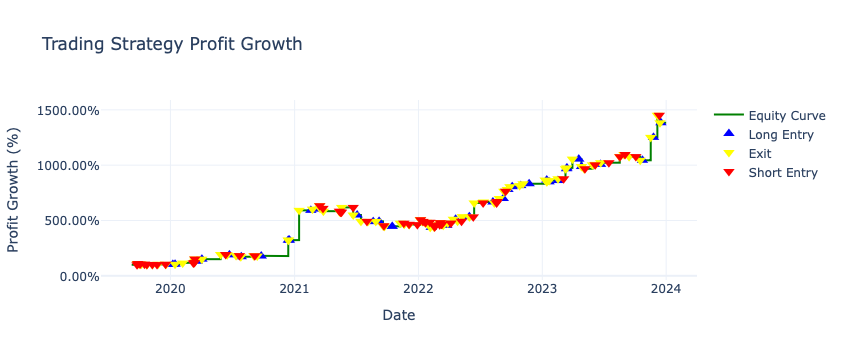

Total Return: 1283.26%
Maximum Drawdown: -30.86%


In [111]:
import pandas as pd
import plotly.graph_objects as go

df=pd.read_csv('BTC_strategy_results.csv')

# Convert 'datetime' column to datetime type
df['datetime'] = pd.to_datetime(df['datetime'])

def calculate_profit_growth(df):
    position = 0  # 0: no position, 1: long, -1: short
    entry_price = 0
    cumulative_return = 100  # Starting value
    returns = []

    for idx, row in df.iterrows():
        if position == 0:  # No position
            if row['signals'] == 1:  # Long entry
                position = 1
                entry_price = row['close']
            elif row['signals'] == -1:  # Short entry
                position = -1
                entry_price = row['close']
            returns.append(cumulative_return)
            
        elif position == 1:  # In long position
            if row['signals'] == -1:  # Long exit
                position = 0
                pct_change = (row['close'] - entry_price) / entry_price
                cumulative_return *= (1 + pct_change)
                entry_price = 0
            returns.append(cumulative_return)
            
        elif position == -1:  # In short position
            if row['signals'] == 1:  # Short exit
                position = 0
                pct_change = (entry_price - row['close']) / entry_price
                cumulative_return *= (1 + pct_change)
                entry_price = 0
            returns.append(cumulative_return)
    
    return pd.Series(returns, index=df.index)

# Calculate cumulative returns
df['cumulative_returns'] = calculate_profit_growth(df)



# Identify long and short entry and exit points using 'trade_type' column
long_entries = df[df['trade_type'] == 'long']
exits = df[df['trade_type'] == 'close']
short_entries = df[df['trade_type'] == 'short']
# short_exits = df[df['trade_type'] == 'close']

# Create the plot
fig = go.Figure()

# Add the equity curve
fig.add_trace(go.Scatter(
    x=df['datetime'],
    y=df['cumulative_returns'],
    mode='lines',
    name='Equity Curve',
    line=dict(color='green', width=2)
))

# Add long entry markers (blue)
fig.add_trace(go.Scatter(
    x=long_entries['datetime'],
    y=long_entries['cumulative_returns'],
    mode='markers',
    name='Long Entry',
    marker=dict(color='blue', size=10, symbol='triangle-up')
))

# Add long exit markers (cyan)
fig.add_trace(go.Scatter(
    x=exits['datetime'],
    y=exits['cumulative_returns'],
    mode='markers',
    name='Exit',
    marker=dict(color='yellow', size=10, symbol='triangle-down')
))

# Add short entry markers (red)
fig.add_trace(go.Scatter(
    x=short_entries['datetime'],
    y=short_entries['cumulative_returns'],
    mode='markers',
    name='Short Entry',
    marker=dict(color='red', size=10, symbol='triangle-down')
))  



# Update layout
fig.update_layout(
    title="Trading Strategy Profit Growth",
    xaxis_title="Date",
    yaxis_title="Profit Growth (%)",
    template='plotly_white',
    yaxis=dict(tickformat='.2f', ticksuffix='%'),
    hovermode='x unified',
    showlegend=True
)


fig.show()



# Print performance metrics
initial_value = 100
final_value = df['cumulative_returns'].iloc[-1]
total_return = ((final_value - initial_value) / initial_value) * 100
print(f"Total Return: {total_return:.2f}%") 

# Calculate drawdown
rolling_max = df['cumulative_returns'].cummax()
drawdown = (df['cumulative_returns'] - rolling_max) / rolling_max * 100
max_drawdown = drawdown.min()
print(f"Maximum Drawdown: {max_drawdown:.2f}%")


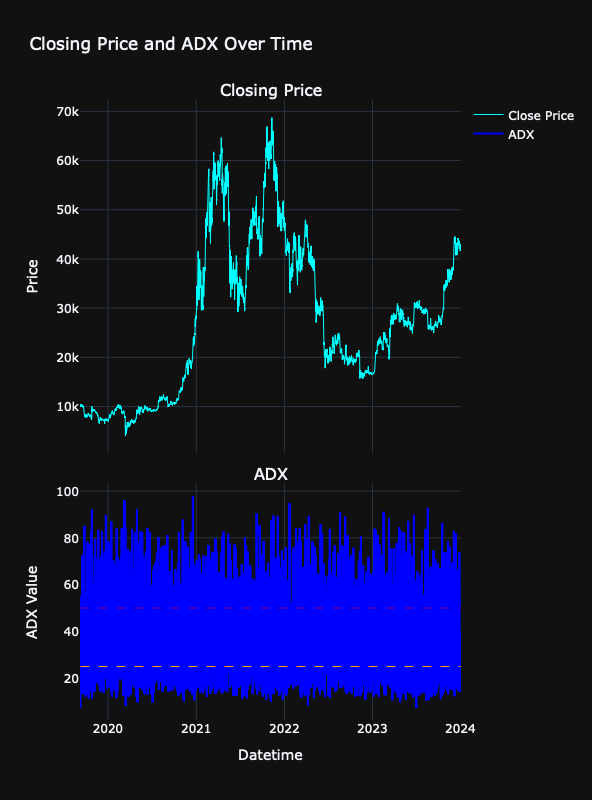

In [18]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plot_adx_price(data):
    """
    Visualize closing price and ADX with respect to datetime.
    
    Parameters:
    - data (pd.DataFrame): DataFrame containing 'datetime', 'close', and 'adx' columns
    """
    # Create a subplot figure with 2 rows: Price and ADX
    fig = make_subplots(rows=2, cols=1, 
                        shared_xaxes=True, 
                        vertical_spacing=0.05,
                        subplot_titles=("Closing Price", "ADX"),
                        row_heights=[0.6, 0.4])  # Price gets more space for visibility

    # 1. Closing Price (First Subplot)
    fig.add_trace(go.Scatter(
        x=data['datetime'],
        y=data['close'],
        mode='lines',
        line=dict(color='cyan', width=1),
        name='Close Price',
        showlegend=True
    ), row=1, col=1)

    # 2. ADX (Second Subplot)
    fig.add_trace(go.Scatter(
        x=data['datetime'],
        y=data['adx'],
        mode='lines',
        line=dict(color='blue', width=2),
        name='ADX',
        showlegend=True
    ), row=2, col=1)

    # Add reference lines for ADX thresholds
    fig.add_shape(
        type="line",
        x0=data['datetime'].min(),
        x1=data['datetime'].max(),
        y0=25,
        y1=25,
        line=dict(color="orange", width=1, dash="dash"),
        row=2, col=1
    )

    fig.add_shape(
        type="line",
        x0=data['datetime'].min(),
        x1=data['datetime'].max(),
        y0=50,
        y1=50,
        line=dict(color="purple", width=1, dash="dash"),
        row=2, col=1
    )

    # Update layout for the figure
    fig.update_layout(
        height=800,  # Height adjusted for two subplots
        title_text="Closing Price and ADX Over Time",
        template='plotly_dark',
        showlegend=True,
        hovermode='x unified'
    )

    # Update y-axis titles for each subplot
    fig.update_yaxes(title_text="Price", row=1, col=1)
    fig.update_yaxes(title_text="ADX Value", row=2, col=1)

    # Update x-axis title for the bottom subplot only
    fig.update_xaxes(title_text="Datetime", row=2, col=1)

    # Show the plot
    fig.show()

# Example usage after processing data
# Assuming 'data' is the output of process_data() with 'datetime', 'close', 'adx'
# data = process_data(your_dataframe)
plot_adx_price(data)